In [94]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import json
import cv2

In [95]:
# !python -m pip install opencv-python
import cv2

In [96]:
import zipfile
zipPath = 'D:\Data_Campus\data\dataset.zip'

In [97]:
archive = zipfile.ZipFile(zipPath, 'r')
archive.namelist()

['1. ┴╓░ú/',
 '1. ┴╓░ú/1. ╕╝└╜/',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000000.jpg',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000001.jpg',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000002.jpg',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000003.jpg',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000004.jpg',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000005.jpg',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000006.jpg',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000007.jpg',
 '1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_000000

파일명을 직접 사용할 수 없어 리스트에서 6개의 후방 카메라 이미지 수동 추출해 사용

In [98]:
archive.printdir()

File Name                                             Modified             Size
1. ┴╓░ú/                                       2022-07-07 14:48:34            0
1. ┴╓░ú/1. ╕╝└╜/                               2022-07-07 14:53:30            0
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/                     2022-07-07 13:28:32            0
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/        2022-05-02 23:59:26            0
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/ 2022-05-02 23:59:26            0
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/ 2022-06-30 09:42:26            0
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000000.jpg 2021-09-17 10:10:50       160813
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000001.jpg 2021-09-17 10:10:50       153372
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000002.jpg 2021-09-17 10:10:50       150928
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/front/1_1_1_20210906_018_00000003.jpg

1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_035/camera/stereo_r/1_1_1_20210906_035_00000022.jpg 2021-10-05 15:46:12       150939
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_035/camera/stereo_r/1_1_1_20210906_035_00000023.jpg 2021-10-05 15:46:12       145285
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_035/camera/stereo_r/1_1_1_20210906_035_00000024.jpg 2021-10-05 15:46:12       142181
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_035/camera/stereo_r/1_1_1_20210906_035_00000025.jpg 2021-10-05 15:46:12       141686
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_035/camera/stereo_r/1_1_1_20210906_035_00000026.jpg 2021-10-05 15:46:12       144191
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_035/camera/stereo_r/1_1_1_20210906_035_00000027.jpg 2021-10-05 15:46:14       141313
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_035/camera/stereo_r/1_1_1_20210906_035_00000028.jpg 2021-10-05 15:46:14       144979
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_035/camera/stereo_r/1_1_1_20210906_035_00000029.jpg 2021-10-05 15:46:14       144501
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_035/c

1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210915_010/camera/stereo_l/1_1_1_20210915_010_00000016.jpg 2021-10-12 16:54:12       315921
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210915_010/camera/stereo_l/1_1_1_20210915_010_00000017.jpg 2021-10-12 16:54:14       242972
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210915_010/camera/stereo_l/1_1_1_20210915_010_00000018.jpg 2021-10-12 16:54:14       276934
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210915_010/camera/stereo_l/1_1_1_20210915_010_00000019.jpg 2021-10-12 16:54:14       299072
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210915_010/camera/stereo_l/1_1_1_20210915_010_00000020.jpg 2021-10-12 16:54:14       347799
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210915_010/camera/stereo_l/1_1_1_20210915_010_00000021.jpg 2021-10-12 16:54:14       335073
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210915_010/camera/stereo_l/1_1_1_20210915_010_00000022.jpg 2021-10-12 16:54:16       314553
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210915_010/camera/stereo_l/1_1_1_20210915_010_00000023.jpg 2021-10-12 16:54:16       280399
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210915_010/c

1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210927_020/camera/right/1_1_1_20210927_020_00000002.jpg 2021-11-17 16:27:24       280686
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210927_020/camera/right/1_1_1_20210927_020_00000009.jpg 2021-11-17 16:27:24       304736
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210927_020/camera/right/1_1_1_20210927_020_00000010.jpg 2021-11-17 16:27:24       311417
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210927_020/camera/right/1_1_1_20210927_020_00000011.jpg 2021-11-17 16:27:24       308061
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210927_020/camera/right/1_1_1_20210927_020_00000012.jpg 2021-11-17 16:27:26       303166
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210927_020/camera/right/1_1_1_20210927_020_00000013.jpg 2021-11-17 16:27:26       299421
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210927_020/camera/right/1_1_1_20210927_020_00000014.jpg 2021-11-17 16:27:26       294589
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210927_020/camera/right/1_1_1_20210927_020_00000015.jpg 2021-11-17 16:27:26       288794
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210927_020/camera/right/1_1_1_202109

1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210928_026/camera/left/1_1_1_20210928_026_00000030.jpg 2021-11-22 19:22:04       352800
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210928_026/camera/left/1_1_1_20210928_026_00000031.jpg 2021-11-22 19:22:06       351342
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210928_026/camera/left/1_1_1_20210928_026_00000032.jpg 2021-11-22 19:22:08       351345
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210928_026/camera/left/1_1_1_20210928_026_00000033.jpg 2021-11-22 19:22:08       351152
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210928_026/camera/left/1_1_1_20210928_026_00000034.jpg 2021-11-22 19:22:10       351531
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210928_026/camera/left/1_1_1_20210928_026_00000035.jpg 2021-11-22 19:22:12       351924
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210928_026/camera/left/1_1_1_20210928_026_00000036.jpg 2021-11-22 19:22:14       352391
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210928_026/camera/left/1_1_1_20210928_026_00000037.jpg 2021-11-22 19:22:14       351441
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210928_026/camera/left/1_1_1_20210928_026_00

1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211026_026/camera/left/1_1_1_20211026_026_00000058.jpg 2021-11-23 17:37:40       261182
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211026_026/camera/left/1_1_1_20211026_026_00000059.jpg 2021-11-23 17:37:42       255820
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211026_026/camera/left/1_1_1_20211026_026_00000060.jpg 2021-11-23 17:37:42       246679
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211026_026/camera/left/1_1_1_20211026_026_00000061.jpg 2021-11-23 17:37:44       246521
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211026_026/camera/left/1_1_1_20211026_026_00000062.jpg 2021-11-23 17:37:46       262124
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211026_026/camera/left/1_1_1_20211026_026_00000063.jpg 2021-11-23 17:37:48       266525
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211026_026/camera/left/1_1_1_20211026_026_00000064.jpg 2021-11-23 17:37:48       262530
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211026_026/camera/left/1_1_1_20211026_026_00000065.jpg 2021-11-23 17:37:50       261633
1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211026_026/camera/left/1_1_1_20211026_026_00

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211027_018/camera/rear/1_1_3_20211027_018_00000110.jpg 2021-11-24 12:16:50       267518
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211027_018/camera/rear/1_1_3_20211027_018_00000111.jpg 2021-11-24 12:16:52       265894
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211027_018/camera/rear/1_1_3_20211027_018_00000112.jpg 2021-11-24 12:16:52       273914
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211027_018/camera/rear/1_1_3_20211027_018_00000113.jpg 2021-11-24 12:16:54       281189
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211027_018/camera/rear/1_1_3_20211027_018_00000114.jpg 2021-11-24 12:16:56       331282
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211027_018/camera/rear/1_1_3_20211027_018_00000115.jpg 2021-11-24 12:16:56       300386
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211027_018/camera/rear/1_1_3_20211027_018_00000116.jpg 2021-11-24 12:16:58       263962
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211027_018/camera/rear/1_1_3_20211027_018_00000117.jpg 2021-11-24 12:17:00       255828
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211027_018/camera/rear/1_1_3_20211027_018_00000118.jpg 2021-1

1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211122_011/camera/left/1_1_3_20211122_011_00000166.jpg 2021-12-10 15:57:52       168911
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211122_011/camera/left/1_1_3_20211122_011_00000186.jpg 2021-12-10 15:57:54       169242
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211122_011/camera/right/ 2022-06-30 09:42:30            0
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211122_011/camera/right/1_1_3_20211122_011_00000000.jpg 2021-12-10 15:57:54       200852
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211122_011/camera/right/1_1_3_20211122_011_00000001.jpg 2021-12-10 15:57:56       213841
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211122_011/camera/right/1_1_3_20211122_011_00000002.jpg 2021-12-10 15:57:58       226880
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211122_011/camera/right/1_1_3_20211122_011_00000003.jpg 2021-12-10 15:57:58       238422
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211122_011/camera/right/1_1_3_20211122_011_00000018.jpg 2021-12-10 15:58:00       211700
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211122_011/camera/right/1_1_3_20211122_011_00000019.jpg 2021-12-10 15:58:02       22585

1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211123_010/camera/front/1_1_3_20211123_010_00000075.jpg 2021-12-13 18:45:22       147966
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211123_010/camera/front/1_1_3_20211123_010_00000076.jpg 2021-12-13 18:45:22       148265
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211123_010/camera/front/1_1_3_20211123_010_00000077.jpg 2021-12-13 18:45:24       149227
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211123_010/camera/front/1_1_3_20211123_010_00000078.jpg 2021-12-13 18:45:26       149584
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211123_010/camera/front/1_1_3_20211123_010_00000079.jpg 2021-12-13 18:45:26       150030
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211123_010/camera/front/1_1_3_20211123_010_00000080.jpg 2021-12-13 18:45:28       150751
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211123_010/camera/front/1_1_3_20211123_010_00000081.jpg 2021-12-13 18:45:30       150886
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211123_010/camera/front/1_1_3_20211123_010_00000082.jpg 2021-12-13 18:45:30       151524
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211123_010/camera/front/1_1_3_20211123_010_00000083.jp

1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_010/camera/front/1_1_3_20211124_010_00000079.jpg 2021-12-14 16:26:44       172807
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_010/camera/front/1_1_3_20211124_010_00000080.jpg 2022-06-27 10:24:14       606412
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_010/camera/front/1_1_3_20211124_010_00000081.jpg 2021-12-14 16:26:48       173337
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_010/camera/front/1_1_3_20211124_010_00000082.jpg 2021-12-14 16:26:48       173064
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_010/camera/front/1_1_3_20211124_010_00000083.jpg 2021-12-14 16:26:50       174664
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_010/camera/front/1_1_3_20211124_010_00000084.jpg 2021-12-14 16:26:52       170955
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_010/camera/front/1_1_3_20211124_010_00000085.jpg 2021-12-14 16:26:52       160228
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_010/camera/front/1_1_3_20211124_010_00000086.jpg 2021-12-14 16:26:54       164476
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_010/camera/front/1_1_3_20211124_010_00000087.jp

1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_028/camera/rear/1_1_3_20211124_028_00000135.jpg 2021-12-14 18:59:14       204646
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_028/camera/rear/1_1_3_20211124_028_00000136.jpg 2021-12-14 18:59:16       204661
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_028/camera/rear/1_1_3_20211124_028_00000137.jpg 2021-12-14 18:59:16       204428
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_028/camera/rear/1_1_3_20211124_028_00000138.jpg 2021-12-14 18:59:18       204683
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_028/camera/rear/1_1_3_20211124_028_00000139.jpg 2021-12-14 18:59:20       204692
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_028/camera/rear/1_1_3_20211124_028_00000140.jpg 2021-12-14 18:59:20       204510
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_028/camera/rear/1_1_3_20211124_028_00000141.jpg 2021-12-14 18:59:22       204476
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_028/camera/rear/1_1_3_20211124_028_00000142.jpg 2021-12-14 18:59:24       203913
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211124_028/camera/rear/1_1_3_20211124_028_00000143.jpg 2021-12

1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211201_034/camera/left/1_1_3_20211201_034_00000008.jpg 2022-01-06 16:09:18       154936
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211201_034/camera/left/1_1_3_20211201_034_00000026.jpg 2022-01-06 16:09:18       239741
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211201_034/camera/left/1_1_3_20211201_034_00000043.jpg 2022-01-06 16:09:20       210914
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211201_034/camera/left/1_1_3_20211201_034_00000044.jpg 2022-01-06 16:09:20       216127
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211201_034/camera/left/1_1_3_20211201_034_00000052.jpg 2022-01-06 16:09:20       209897
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211201_034/camera/left/1_1_3_20211201_034_00000053.jpg 2022-01-06 16:09:20       210553
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211201_034/camera/left/1_1_3_20211201_034_00000083.jpg 2022-01-06 16:09:20       164593
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211201_034/camera/left/1_1_3_20211201_034_00000084.jpg 2022-01-06 16:09:22       173560
1. ┴╓░ú/1. ╕╝└╜/3. ░±╕±/20211201_034/camera/left/1_1_3_20211201_034_00000085.jpg 2022-01

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_016/camera/stereo_l/1_1_7_20210906_016_00000232.jpg 2021-09-16 18:14:38       161667
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_016/camera/stereo_l/1_1_7_20210906_016_00000233.jpg 2021-09-16 18:14:38       166498
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_016/camera/stereo_l/1_1_7_20210906_016_00000234.jpg 2021-09-16 18:14:38       163984
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_016/camera/stereo_l/1_1_7_20210906_016_00000235.jpg 2021-09-16 18:14:38       165792
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_016/camera/stereo_l/1_1_7_20210906_016_00000236.jpg 2021-09-16 18:14:40       169323
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_016/camera/stereo_l/1_1_7_20210906_016_00000237.jpg 2021-09-16 18:14:40       170710
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_016/camera/stereo_l/1_1_7_20210906_016_00000238.jpg 2021-09-16 18:14:40       170428
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_016/camera/stereo_l/1_1_7_20210906_016_00000239.jpg 2021-09-16 18:14:40       169958
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙

1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_040/camera/rear/1_1_7_20210906_040_00000021.jpg 2021-10-05 18:04:08       119968
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_040/camera/rear/1_1_7_20210906_040_00000022.jpg 2022-06-24 15:58:46       133626
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_040/camera/rear/1_1_7_20210906_040_00000023.jpg 2021-10-05 18:04:08       127740
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_040/camera/rear/1_1_7_20210906_040_00000024.jpg 2021-10-05 18:04:10       127790
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_040/camera/rear/1_1_7_20210906_040_00000025.jpg 2021-10-05 18:04:10       119655
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_040/camera/rear/1_1_7_20210906_040_00000026.jpg 2021-10-05 18:04:10       134823
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_040/camera/rear/1_1_7_20210906_040_00000027.jpg 2021-10-05 18:04:10       136156
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_040/camera/rear/1_1_7_20210906_040_00000028.jpg 2021-10-05 18:04:12       127421
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_040/camera/rear/1_1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210928_003/camera/left/1_1_7_20210928_003_00000067.jpg 2021-11-19 11:13:22       198032
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210928_003/camera/left/1_1_7_20210928_003_00000068.jpg 2021-11-19 11:13:24       205051
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210928_003/camera/left/1_1_7_20210928_003_00000069.jpg 2021-11-19 11:13:24       203558
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210928_003/camera/left/1_1_7_20210928_003_00000070.jpg 2021-11-19 11:13:24       203089
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210928_003/camera/left/1_1_7_20210928_003_00000071.jpg 2021-11-19 11:13:24       191442
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210928_003/camera/left/1_1_7_20210928_003_00000072.jpg 2021-11-19 11:13:24       186670
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210928_003/camera/left/1_1_7_20210928_003_00000073.jpg 2021-11-19 11:13:26       182718
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210928_003/camera/left/1_1_7_20210928_003_00000074.jpg 2021-11-19 11:13:26       211801
1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210928_003/camera/left/1_1

1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_007/camera/stereo_l/1_1_8_20210826_007_00000022.jpg 2021-09-06 15:29:16       163933
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_007/camera/stereo_l/1_1_8_20210826_007_00000023.jpg 2021-09-06 15:29:16       165085
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_007/camera/stereo_l/1_1_8_20210826_007_00000024.jpg 2021-09-06 15:29:16       166150
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_007/camera/stereo_l/1_1_8_20210826_007_00000025.jpg 2021-09-06 15:29:18       163309
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_007/camera/stereo_l/1_1_8_20210826_007_00000026.jpg 2021-09-06 15:29:18       161735
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_007/camera/stereo_l/1_1_8_20210826_007_00000027.jpg 2021-09-06 15:29:18       163207
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_007/camera/stereo_l/1_1_8_20210826_007_00000028.jpg 2021-09-06 15:29:18       162449
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_007/camera/stereo_l/1_1_8_20210826_007_00000029.jpg 2021-09-0

1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_014/camera/stereo_l/1_1_8_20210826_014_00000254.jpg 2021-09-07 16:08:44       270604
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_014/camera/stereo_l/1_1_8_20210826_014_00000255.jpg 2021-09-07 16:08:44       239488
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_014/camera/stereo_l/1_1_8_20210826_014_00000256.jpg 2021-09-07 16:08:46       214173
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_014/camera/stereo_l/1_1_8_20210826_014_00000257.jpg 2021-09-07 16:08:46       222403
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_014/camera/stereo_l/1_1_8_20210826_014_00000258.jpg 2021-09-07 16:08:46       194004
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_014/camera/stereo_l/1_1_8_20210826_014_00000259.jpg 2021-09-07 16:08:46       227662
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_014/camera/stereo_l/1_1_8_20210826_014_00000260.jpg 2021-09-07 16:08:48       243116
1. ┴╓░ú/1. ╕╝└╜/8. └┌╡┐┬≈└ⁿ┐δ╡╡╖╬/20210826_014/camera/stereo_l/1_1_8_20210826_014_00000261.jpg 2021-09-0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2. ╛▀░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211110_021/camera/stereo_r/2_1_1_20211110_021_00000051.jpg 2021-11-25 19:54:42       350395
2. ╛▀░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211110_021/camera/stereo_r/2_1_1_20211110_021_00000052.jpg 2021-11-25 19:54:42       357129
2. ╛▀░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211110_021/camera/stereo_r/2_1_1_20211110_021_00000053.jpg 2021-11-25 19:54:44       353832
2. ╛▀░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211110_021/camera/stereo_r/2_1_1_20211110_021_00000054.jpg 2021-11-25 19:54:46       349147
2. ╛▀░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211110_021/camera/stereo_r/2_1_1_20211110_021_00000055.jpg 2021-11-25 19:54:46       349334
2. ╛▀░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211110_021/camera/stereo_r/2_1_1_20211110_021_00000056.jpg 2021-11-25 19:54:48       347421
2. ╛▀░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211110_021/camera/stereo_r/2_1_1_20211110_021_00000057.jpg 2021-11-25 19:54:50       341411
2. ╛▀░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211110_021/camera/stereo_r/2_1_1_20211110_021_00000058.jpg 2021-11-25 19:54:52       315639
2. ╛▀░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20211110_021/

2. ╛▀░ú/1. ╕╝└╜/2. ╜┼╡╡╜╔/20211110_039/camera/stereo_l/2_1_2_20211110_039_00000053.jpg 2021-11-25 23:53:32       342418
2. ╛▀░ú/1. ╕╝└╜/2. ╜┼╡╡╜╔/20211110_039/camera/stereo_l/2_1_2_20211110_039_00000054.jpg 2021-11-25 23:53:34       348689
2. ╛▀░ú/1. ╕╝└╜/2. ╜┼╡╡╜╔/20211110_039/camera/stereo_l/2_1_2_20211110_039_00000055.jpg 2021-11-25 23:53:34       340001
2. ╛▀░ú/1. ╕╝└╜/2. ╜┼╡╡╜╔/20211110_039/camera/stereo_l/2_1_2_20211110_039_00000056.jpg 2021-11-25 23:53:36       344184
2. ╛▀░ú/1. ╕╝└╜/2. ╜┼╡╡╜╔/20211110_039/camera/stereo_l/2_1_2_20211110_039_00000057.jpg 2021-11-25 23:53:36       348979
2. ╛▀░ú/1. ╕╝└╜/2. ╜┼╡╡╜╔/20211110_039/camera/stereo_l/2_1_2_20211110_039_00000058.jpg 2021-11-25 23:53:38       347767
2. ╛▀░ú/1. ╕╝└╜/2. ╜┼╡╡╜╔/20211110_039/camera/stereo_l/2_1_2_20211110_039_00000059.jpg 2021-11-25 23:53:40       350540
2. ╛▀░ú/1. ╕╝└╜/2. ╜┼╡╡╜╔/20211110_039/camera/stereo_l/2_1_2_20211110_039_00000060.jpg 2021-11-25 23:53:40       343296
2. ╛▀░ú/1. ╕╝└╜/2. ╜┼╡╡╜╔/20211110_039/c

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211109_012/camera/stereo_r/2_1_3_20211109_012_00000020.jpg 2021-11-25 11:16:46       293172
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211109_012/camera/stereo_r/2_1_3_20211109_012_00000021.jpg 2021-11-25 11:16:48       304632
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211109_012/camera/stereo_r/2_1_3_20211109_012_00000022.jpg 2021-11-25 11:16:48       309390
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211109_012/camera/stereo_r/2_1_3_20211109_012_00000023.jpg 2021-11-25 11:16:50       298492
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211109_012/camera/stereo_r/2_1_3_20211109_012_00000024.jpg 2021-11-25 11:16:52       295374
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211109_012/camera/stereo_r/2_1_3_20211109_012_00000025.jpg 2021-11-25 11:16:52       272991
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211109_012/camera/stereo_r/2_1_3_20211109_012_00000026.jpg 2021-11-25 11:16:54       256378
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211109_012/camera/stereo_r/2_1_3_20211109_012_00000027.jpg 2021-11-25 11:16:56       235827
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211109_012/camera/stereo_r/2_1

2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_006/camera/stereo_r/2_1_3_20211110_006_00000067.jpg 2021-11-25 17:07:08       358044
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_006/camera/stereo_r/2_1_3_20211110_006_00000068.jpg 2021-11-25 17:07:08       354088
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_006/camera/stereo_r/2_1_3_20211110_006_00000069.jpg 2021-11-25 17:07:10       353511
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_006/camera/stereo_r/2_1_3_20211110_006_00000070.jpg 2021-11-25 17:07:12       344265
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_006/camera/stereo_r/2_1_3_20211110_006_00000071.jpg 2021-11-25 17:07:14       335218
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_006/camera/stereo_r/2_1_3_20211110_006_00000072.jpg 2021-11-25 17:07:14       315176
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_006/camera/stereo_r/2_1_3_20211110_006_00000073.jpg 2021-11-25 17:07:16       332863
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_006/camera/stereo_r/2_1_3_20211110_006_00000074.jpg 2021-11-25 17:07:18       340886
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_006/camera/stereo_r/2_1

2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_018/camera/left/2_1_3_20211110_018_00000111.jpg 2021-11-25 19:01:34       226280
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_018/camera/left/2_1_3_20211110_018_00000112.jpg 2021-11-25 19:01:36       249413
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_018/camera/left/2_1_3_20211110_018_00000113.jpg 2021-11-25 19:01:36       245808
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_018/camera/left/2_1_3_20211110_018_00000115.jpg 2021-11-25 19:01:38       229328
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_018/camera/left/2_1_3_20211110_018_00000116.jpg 2021-11-25 19:01:40       207732
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_018/camera/left/2_1_3_20211110_018_00000117.jpg 2021-11-25 19:01:40       204937
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_018/camera/left/2_1_3_20211110_018_00000118.jpg 2021-11-25 19:01:42       210835
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_018/camera/left/2_1_3_20211110_018_00000119.jpg 2021-11-25 19:01:44       163682
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_018/camera/left/2_1_3_20211110_018_00000132.jpg 2021-11

2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_030/camera/right/2_1_3_20211110_030_00000087.jpg 2021-11-25 21:49:20       277346
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_030/camera/right/2_1_3_20211110_030_00000088.jpg 2021-11-25 21:49:22       285343
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_030/camera/right/2_1_3_20211110_030_00000089.jpg 2021-11-25 21:49:24       295907
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_030/camera/right/2_1_3_20211110_030_00000092.jpg 2021-11-25 21:49:24       298249
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_030/camera/right/2_1_3_20211110_030_00000098.jpg 2021-11-25 21:49:26       236102
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_030/camera/right/2_1_3_20211110_030_00000099.jpg 2021-11-25 21:49:28       232933
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_030/camera/right/2_1_3_20211110_030_00000103.jpg 2021-11-25 21:49:28       252031
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_030/camera/right/2_1_3_20211110_030_00000110.jpg 2021-11-25 21:49:30       278104
2. ╛▀░ú/1. ╕╝└╜/3. ░±╕±/20211110_030/camera/right/2_1_3_20211110_030_00000111.jp

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



이미지 갯수 약 22만 개

In [37]:
len(archive.namelist())

224016

폴더 압축 해제하지 않고 압축 폴더 내 이미지 1개씩 압축 해제해 사용

In [36]:
archive.extract('1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/rear/')

'C:\\Users\\wheeb\\Documents\\1. ┴╓░ú\\1. ╕╝└╜\\1. ▒╕╡╡╜╔\\20210906_018\\camera\\rear'

image 1

In [26]:
img1 = archive.extract('1. ┴╓░ú/1. ╕╝└╜/1. ▒╕╡╡╜╔/20210906_018/camera/rear/1_1_1_20210906_018_00000000.jpg')

In [31]:
img1

'C:\\Users\\wheeb\\Documents\\1. ┴╓░ú\\1. ╕╝└╜\\1. ▒╕╡╡╜╔\\20210906_018\\camera\\rear\\1_1_1_20210906_018_00000000.jpg'

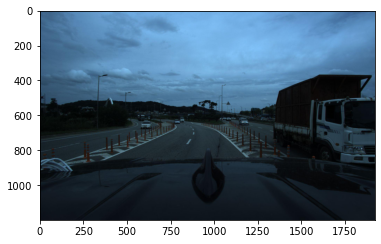

In [68]:
img = plt.imread(img1)
plt.imshow(img)

In [34]:
img.shape

(1200, 1920, 3)

RGB 분포 분석

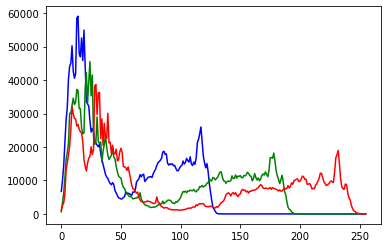

In [69]:
channels = cv2.split(img)
colors = ('b', 'g', 'r')
for (ch, color) in zip (channels, colors):
    hist = cv2.calcHist([ch], [0], None, [256], [0, 256])
    plt.plot(hist, color = color)
plt.show()

image 2

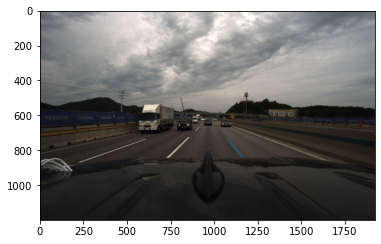

In [70]:
img2 = archive.extract('1. ┴╓░ú/1. ╕╝└╜/7. ░φ╝╙╡╡╖╬/20210906_012/camera/rear/1_1_7_20210906_012_00000101.jpg')
img = plt.imread(img2)
plt.imshow(img)

In [71]:
img.shape

(1200, 1920, 3)

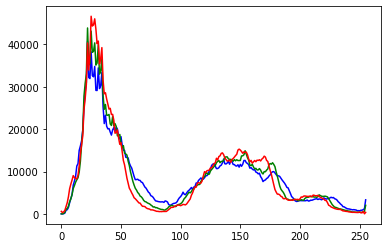

In [72]:
channels = cv2.split(img)
colors = ('b', 'g', 'r')
for (ch, color) in zip (channels, colors):
    hist = cv2.calcHist([ch], [0], None, [256], [0, 256])
    plt.plot(hist, color = color)
plt.show()

image 3

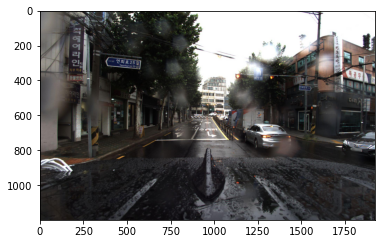

In [73]:
img3 = archive.extract('1. ┴╓░ú/2. ║±/1. ▒╕╡╡╜╔/20210907_024/camera/rear/1_2_1_20210907_024_00000124.jpg')
img = plt.imread(img3)
plt.imshow(img)

In [74]:
img.shape

(1200, 1920, 3)

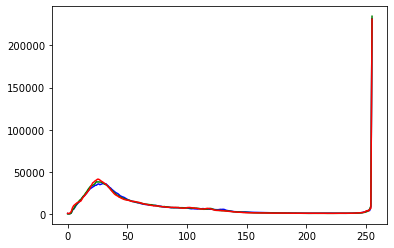

In [75]:
channels = cv2.split(img)
colors = ('b', 'g', 'r')
for (ch, color) in zip (channels, colors):
    hist = cv2.calcHist([ch], [0], None, [256], [0, 256])
    plt.plot(hist, color = color)
plt.show()

image 4

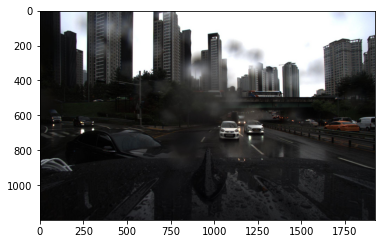

In [76]:
img4 = archive.extract('1. ┴╓░ú/2. ║±/2. ╜┼╡╡╜╔/20210907_062/camera/rear/1_2_2_20210907_062_00000081.jpg')
img = plt.imread(img4)
plt.imshow(img)

In [77]:
img.shape

(1200, 1920, 3)

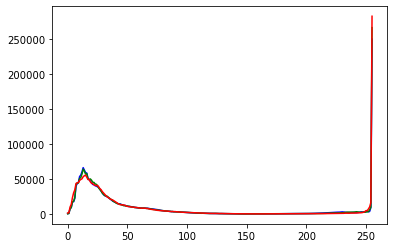

In [78]:
channels = cv2.split(img)
colors = ('b', 'g', 'r')
for (ch, color) in zip (channels, colors):
    hist = cv2.calcHist([ch], [0], None, [256], [0, 256])
    plt.plot(hist, color = color)
plt.show()

image 5

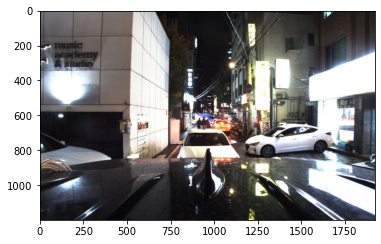

In [79]:

img5 = archive.extract('2. ╛▀░ú/2. ║±/3. ░±╕±/20211109_001/camera/rear/2_2_3_20211109_001_00000056.jpg')
img = plt.imread(img5)
plt.imshow(img)

In [80]:
img.shape

(1200, 1920, 3)

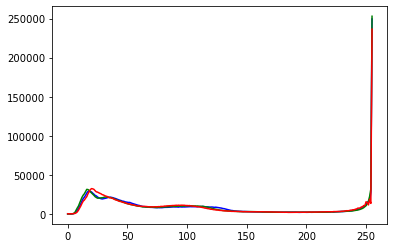

In [81]:
channels = cv2.split(img)
colors = ('b', 'g', 'r')
for (ch, color) in zip (channels, colors):
    hist = cv2.calcHist([ch], [0], None, [256], [0, 256])
    plt.plot(hist, color = color)
plt.show()

image 6

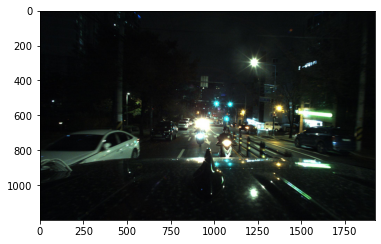

In [82]:
img6 = archive.extract('2. ╛▀░ú/2. ║±/1. ▒╕╡╡╜╔/20211109_008/camera/rear/2_2_1_20211109_008_00000000.jpg')
img = plt.imread(img6)
plt.imshow(img)

In [83]:
img.shape

(1200, 1920, 3)

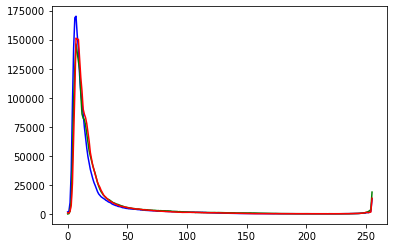

In [84]:
channels = cv2.split(img)
colors = ('b', 'g', 'r')
for (ch, color) in zip (channels, colors):
    hist = cv2.calcHist([ch], [0], None, [256], [0, 256])
    plt.plot(hist, color = color)
plt.show()